In [137]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

In [138]:
def newtons_method(x0, f, f_prime, tolerance, epsilon, max_iterations):
    """Newton's method

    Args:
      x0:              The initial guess
      f:               The function whose root we are trying to find
      f_prime:         The derivative of the function
      tolerance:       Stop when iterations change by less than this
      epsilon:         Do not divide by a number smaller than this
      max_iterations:  The maximum number of iterations to compute
    """
    x_values = [x0]
    y_prime_values = []
    for _ in range(max_iterations):
        y = f(x0)
        yprime = f_prime(x0)
        y_prime_values.append(yprime)

        if abs(yprime) < epsilon:  
            break

        x1 = x0 - y / yprime  

        if (
            abs(x1 - x0) <= tolerance
        ):  
            x_values.append(x1)
            return x1, x_values  

        x0 = x1  
        x_values.append(x0)

    return None, x_values

def plot_values_iterations(values, title, y_label, max_iteration=30):
    iterations = range(len(values))
    plt.plot(iterations[:max_iteration], values[:max_iteration], "bo-", label=y_label)
    plt.xlabel("Iteration Number")
    plt.ylabel(y_label)
    plt.title(title)
    plt.axhline(0, color="black", linewidth=0.5)
    plt.axvline(0, color="black", linewidth=0.5)
    plt.grid(color="gray", linestyle="--", linewidth=0.5)
    plt.legend()
    plt.show()


def plot_function(f, title, y_label):
    x_values = np.linspace(-2, 2, 400)
    y_values = f(x_values)
    plt.plot(x_values, y_values, label=y_label)
    plt.xlabel("x")
    plt.ylabel(y_label)
    plt.title(title)
    plt.axhline(0, color="black", linewidth=0.5)
    plt.axvline(0, color="black", linewidth=0.5)
    plt.grid(color="gray", linestyle="--", linewidth=0.5)
    plt.legend()
    plt.show()

In [139]:
import matplotlib.animation as animation
from IPython.display import HTML

def animate_newtons_method(x_values, f, f_prime):
    fig, ax = plt.subplots()
    x = np.linspace(-2, 2, 400)
    y = f(x)
    ax.plot(x, y, label="f(x)")
    point, = ax.plot([], [], "ro")
    slope_line, = ax.plot([], [], "b-")
    x1_point, = ax.plot([], [], "bo")
    vertical_line, = ax.plot([], [], "b--")

    def init():
        point.set_data([], [])
        slope_line.set_data([], [])
        x1_point.set_data([], [])
        vertical_line.set_data([], [])
        return point, slope_line, x1_point, vertical_line

    def update(frame):
        if frame % 3 == 0:
            # Render the red dot at x0
            x_val = x_values[frame // 3]
            y_val = f(x_val)
            point.set_data([x_val], [y_val])
            slope_line.set_data([], [])
            x1_point.set_data([], [])
            vertical_line.set_data([], [])
        elif frame % 3 == 1:
            # Render the slope line
            x_val = x_values[frame // 3]
            y_val = f(x_val)
            slope = f_prime(x_val)
            x_min, x_max = ax.get_xlim()
            y_min = slope * (x_min - x_val) + y_val
            y_max = slope * (x_max - x_val) + y_val
            slope_line.set_data([x_min, x_max], [y_min, y_max])
            x1_point.set_data([], [])
            vertical_line.set_data([], [])
        else:
            # Render the blue dot at x1 and the vertical line
            if frame // 3 + 1 < len(x_values):
                x1_val = x_values[frame // 3 + 1]
            else:
                x1_val = x_values[-1]
            y1_val = f(x1_val)
            x1_point.set_data([x1_val], [y1_val])
            vertical_line.set_data([x1_val, x1_val], [0, y1_val])
        return point, slope_line, x1_point, vertical_line

    ani = animation.FuncAnimation(
        fig,
        update,
        frames=3 * (len(x_values) - 1),
        init_func=init,
        blit=False,  # Ensure compatibility with to_jshtml
        repeat=False,
        interval=500,
    )

    plt.axhline(0, color="black", linewidth=0.5)
    plt.axvline(0, color="black", linewidth=0.5)
    plt.grid(color="gray", linestyle="--", linewidth=0.5)

    animation_html = HTML(ani.to_jshtml())

    return animation_html

Success: -1.3247179572453902


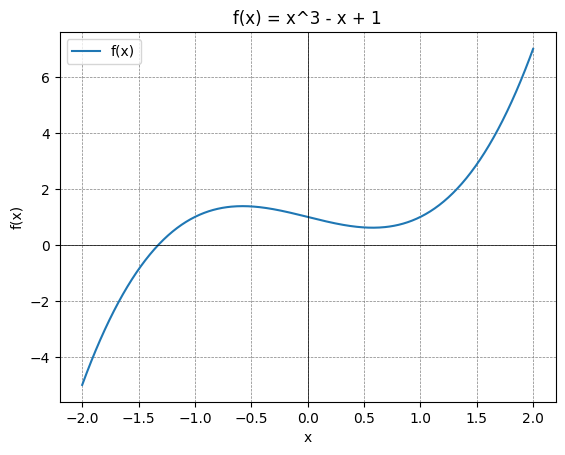

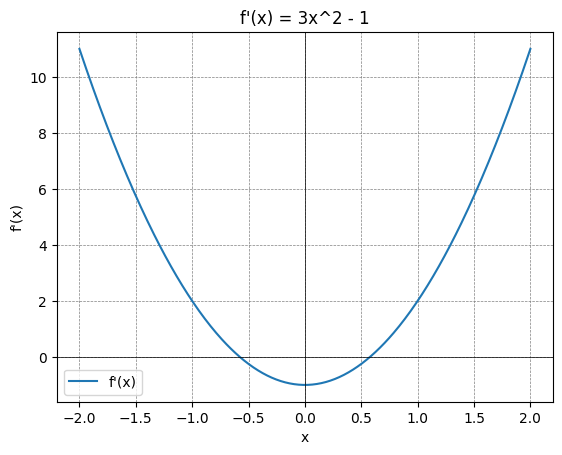

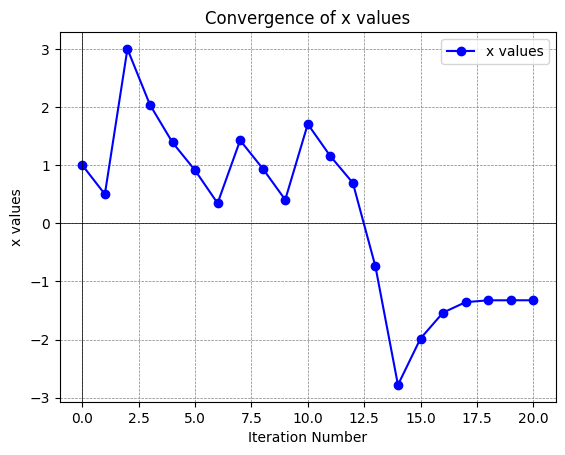

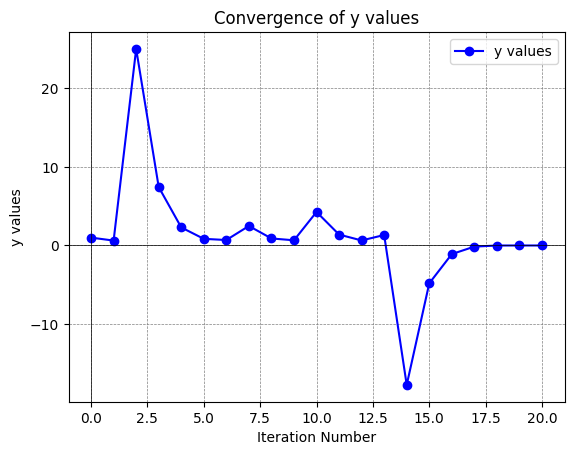

In [140]:
def f(x):
    return x**3 - x + 1


def f_prime(x):
    return 3 * x**2 - 1

x0 = 1.0
tolerance = 1e-6
epsilon = 1e-12
max_iterations = 1000

result, x_values = newtons_method(
    x0, f, f_prime, tolerance, epsilon, max_iterations
)

if result is not None:
    print(f"Success: {result}")
else:
    print("Failure: Newton's method did not converge")

plot_function(f, "f(x) = x^3 - x + 1", "f(x)")
plot_function(f_prime, "f'(x) = 3x^2 - 1", "f'(x)")
plot_values_iterations(x_values, "Convergence of x values", "x values", 30)
y_values = [f(x) for x in x_values]
plot_values_iterations(y_values, "Convergence of y values", "y values", 30)

In [141]:
ani = animate_newtons_method(x_values, f, f_prime)
display(ani)
plt.close()

Failure: Newton's method did not converge


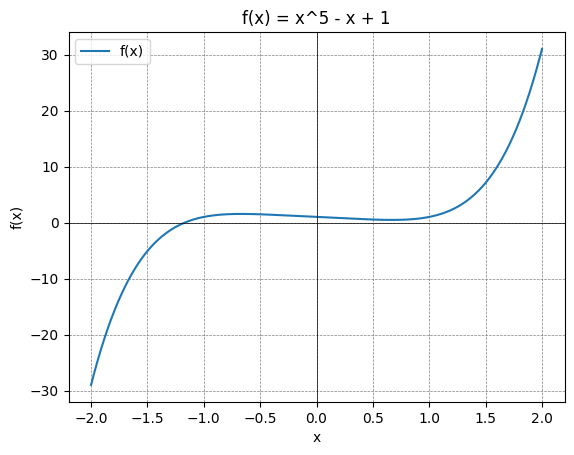

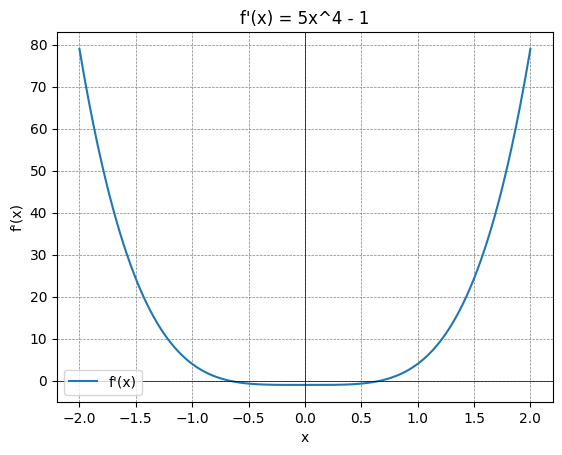

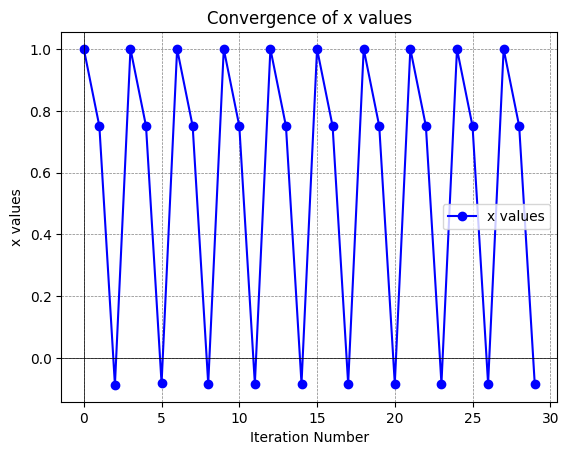

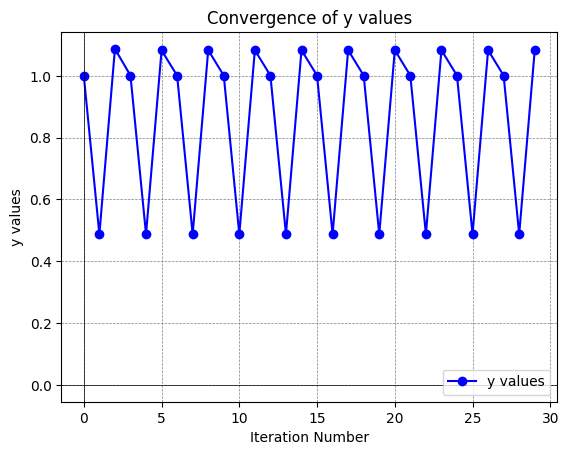

In [142]:
def f(x):
    return x**5 - x + 1


def f_prime(x):
    return 5 * x**4 - 1

x0 = 1.0
tolerance = 1e-6
epsilon = 1e-12
max_iterations = 100

result, x_values = newtons_method(
    x0, f, f_prime, tolerance, epsilon, max_iterations
)

if result is not None:
    print(f"Success: {result}")
else:
    print("Failure: Newton's method did not converge")

plot_function(f, "f(x) = x^5 - x + 1", "f(x)")
plot_function(f_prime, "f'(x) = 5x^4 - 1", "f'(x)")
plot_values_iterations(x_values, "Convergence of x values", "x values", 30)
y_values = [f(x) for x in x_values]
plot_values_iterations(y_values, "Convergence of y values", "y values", 30)

In [143]:
ani = animate_newtons_method(x_values, f, f_prime)
display(ani)
plt.close()